In [367]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr, mean_squared_error as mse
import cv2
from scipy.ndimage import gaussian_filter
from scipy.sparse import diags, kron, identity
from scipy.sparse.linalg import spsolve
from skimage.transform import resize
from scipy.integrate import solve_ivp

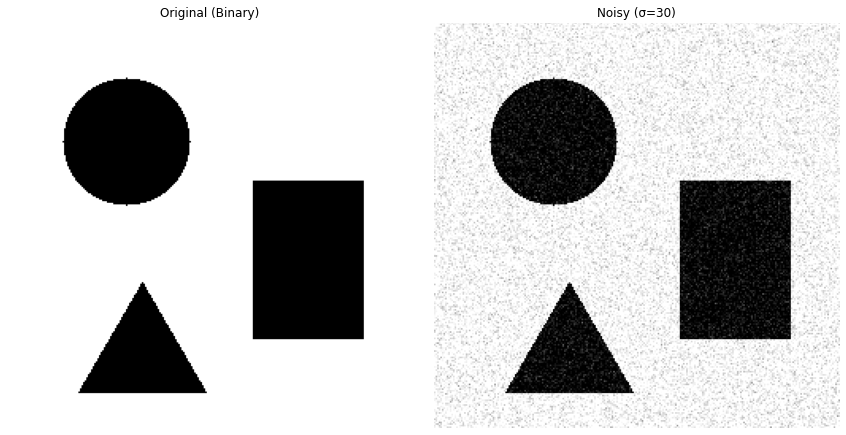

In [368]:
# --- Create Synthetic Binary Image with Black Shapes on White Background ---
h, w = 256, 256
synth_img = np.ones((h, w), dtype=np.uint8) * 255  # White background

# Draw black filled circle
circle_center = (75, 75)
rad = 40
synth_img = cv2.circle(synth_img, circle_center, rad, 0, -1)

# Draw black filled rectangle
rect_center = (150, 190)
rect_h = 100
rect_w = 70
synth_img[rect_center[0]-rect_h//2:rect_center[0]+rect_h//2,
          rect_center[1]-rect_w//2:rect_center[1]+rect_w//2] = 0

# Draw black filled triangle
triangle_center = (85, 210)
side = 80
height = int(np.sqrt(3) / 2 * side)
pt1 = (triangle_center[0], triangle_center[1] - 2 * height // 3)
pt2 = (triangle_center[0] - side // 2, triangle_center[1] + height // 3)
pt3 = (triangle_center[0] + side // 2, triangle_center[1] + height // 3)
pts = np.array([pt1, pt2, pt3], np.int32).reshape((-1, 1, 2))
cv2.fillPoly(synth_img, [pts], 0)

# --- Add Gaussian Noise ---
noise_coeff = 30
original = synth_img.astype(np.float32)
noise = noise_coeff * np.random.randn(*original.shape)
noisy_img = np.clip(original + noise, 0, 255)

# --- Plot Original and Noisy Images ---
fig1, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(synth_img, cmap='gray')
axes[0].set_title('Original (Binary)')
axes[0].axis('off')

axes[1].imshow(noisy_img, cmap='gray')
axes[1].set_title(f'Noisy (σ={noise_coeff})')
axes[1].axis('off')

plt.tight_layout()
fig1.savefig('Project/inputs.png')
plt.show()

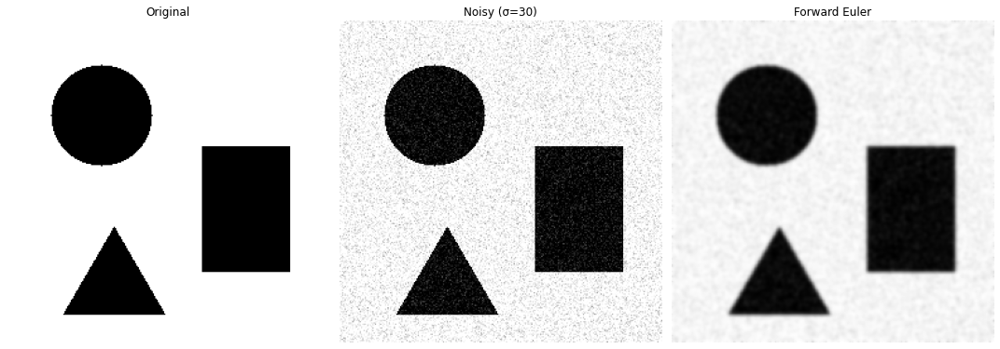

In [369]:
# Forward Euler in time, Centered difference in Space
def f_euler(u, alpha, dt, dx):
    u_new = u.copy()
    u_new[1:-1, 1:-1] = u[1:-1, 1:-1] + alpha * dt / dx**2 * (
        u[2:, 1:-1] + u[:-2, 1:-1] + u[1:-1, 2:] + u[1:-1, :-2] - 4 * u[1:-1, 1:-1])
    return u_new


#Implementation
# Show for 2 values of alpha=0.1,0.3 (>< 0.25; CFL)
dx = dy = 1.0
alpha = 1
dt = 0.1
num_iters = 10

#Neumann 
padded = np.pad(noisy_img, 1, mode='edge')
f_euler_denoised = padded.copy()
for _ in range(num_iters):
    f_euler_denoised = f_euler(f_euler_denoised, alpha, dt, dx)
f_euler_denoised = f_euler_denoised[1:-1, 1:-1]


fig_fe, axes = plt.subplots(1, 3, figsize=(15, 6))
axes = axes.flatten()
axes[0].imshow(synth_img, cmap='gray')
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(noisy_img, cmap='gray')
axes[1].set_title(f'Noisy (σ={noise_coeff})')
axes[1].axis('off')

axes[2].imshow(f_euler_denoised, cmap='gray')
axes[2].set_title('Forward Euler')
axes[2].axis('off')
plt.tight_layout()
fig_fe.savefig('Project/F_Euler_1.png',transparent=True)
plt.show()

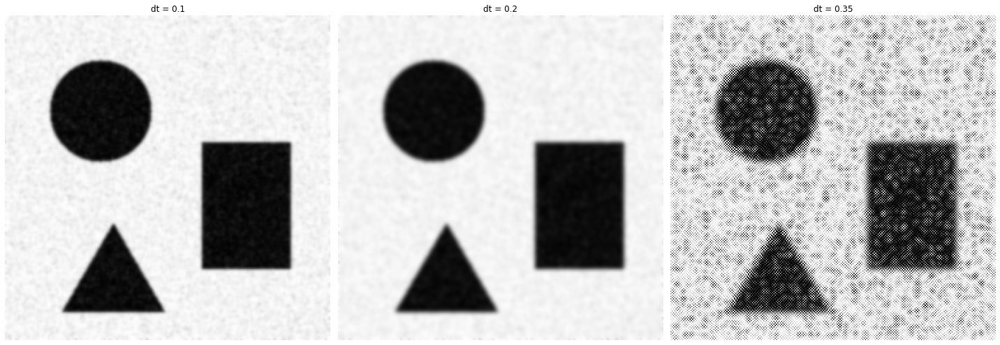

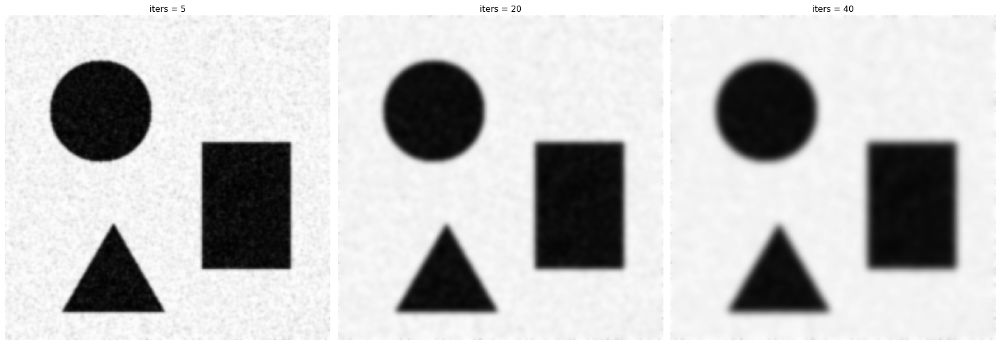

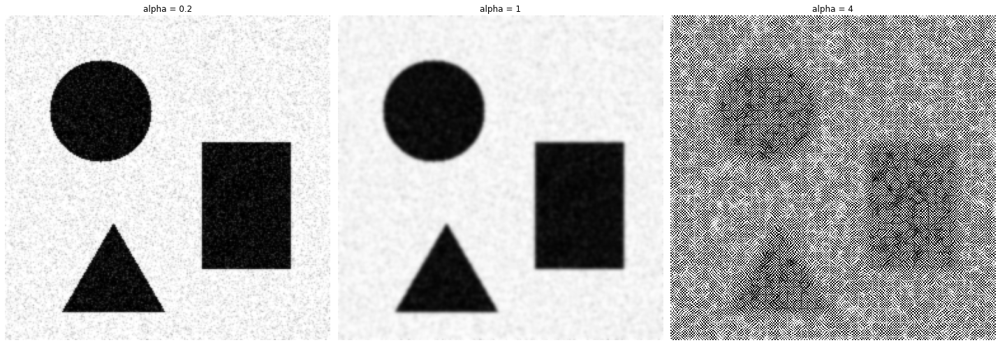

In [370]:
#Report Results
dx = dy = 1.0

# ------------------------
# 1. Varying delta t
# ------------------------
dt_vals = [0.1, 0.2, 0.35]
alpha = 1
num_iters = 7

fig_t, axes = plt.subplots(1, len(dt_vals), figsize=(20, 8))
for i, dt in enumerate(dt_vals):
    padded = np.pad(noisy_img, 1, mode='edge')
    result = padded.copy()
    for _ in range(num_iters):
        result = f_euler(result, alpha, dt, dx)
    result = result[1:-1, 1:-1]
    axes[i].imshow(result, cmap='gray', vmin=0, vmax=255)
    axes[i].set_title(f"dt = {dt}")
    axes[i].axis('off')
plt.tight_layout()
fig_t.savefig('Project/F_Euler_t.png',transparent=True)
plt.show()

# ------------------------
# 2. Varying number of iterations
# ------------------------
iter_vals = [5, 20, 40]
alpha = 1
dt = 0.1

fig_it, axes = plt.subplots(1, len(iter_vals), figsize=(20, 8))
for i, num_iters in enumerate(iter_vals):
    padded = np.pad(noisy_img, 1, mode='edge')
    result = padded.copy()
    for _ in range(num_iters):
        result = f_euler(result, alpha, dt, dx)
    result = result[1:-1, 1:-1]
    axes[i].imshow(result, cmap='gray', vmin=0, vmax=255)
    axes[i].set_title(f"iters = {num_iters}")
    axes[i].axis('off')
plt.tight_layout()
fig_it.savefig('Project/F_Euler_iter.png',transparent=True)
plt.show()

# ------------------------
# 3. Varying alpha
# ------------------------
alpha_vals = [0.2, 1, 4]
dt = 0.1
num_iters = 8

fig_alpha, axes = plt.subplots(1, len(alpha_vals), figsize=(20, 8))
for i, alpha in enumerate(alpha_vals):
    padded = np.pad(noisy_img, 1, mode='edge')
    result = padded.copy()
    for _ in range(num_iters):
        result = f_euler(result, alpha, dt, dx)
    result = result[1:-1, 1:-1]
    axes[i].imshow(result, cmap='gray', vmin=0, vmax=255)
    axes[i].set_title(f"alpha = {alpha}")
    axes[i].axis('off')
plt.tight_layout()
fig_alpha.savefig('Project/F_Euler_alpha.png',transparent=True)
plt.show()


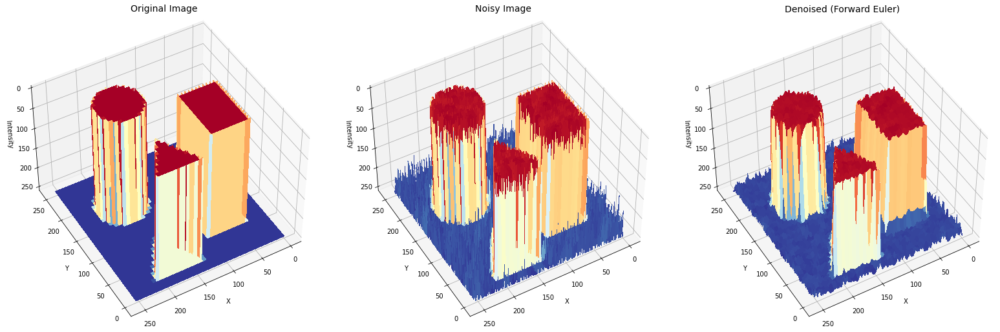

In [371]:
#F.Euler heatmaps

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

images = [synth_img, noisy_img, f_euler_denoised]
titles = ['Original Image', 'Noisy Image', 'Denoised (Forward Euler)']

X, Y = np.meshgrid(np.arange(synth_img.shape[1]), np.arange(synth_img.shape[0]))

fig_fehmp = plt.figure(figsize=(22, 7))
for i in range(3):
    rotated_img = np.rot90(images[i], k=2)
    ax = fig_fehmp.add_subplot(1, 3, i+1, projection='3d')
    ax.plot_surface(X, Y,rotated_img, cmap='RdYlBu', linewidth=0, antialiased=False)
    ax.set_title(titles[i], fontsize=14)
    ax.set_zlim(0, 255)
    ax.view_init(elev=45, azim=-120)
    ax.set_xlabel('X'), ax.set_ylabel('Y'), ax.set_zlabel('Intensity')
    ax.set_zlim(ax.get_zlim()[::-1])
    ax.invert_xaxis()

plt.tight_layout()
fig_fehmp.savefig('Project/F_Euler_HMap.png')
plt.show()


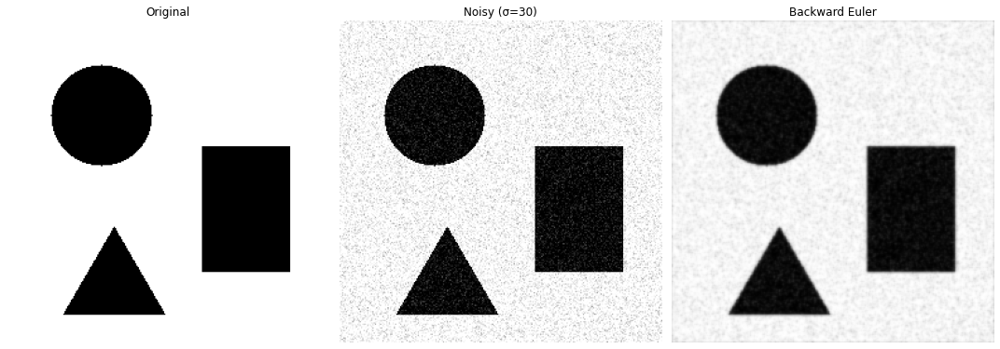

In [372]:
# Backward Euler in time, Centered difference in Space
def backward_euler(u0, alpha, dt, dx, num_iters):
    u0 = u0.astype(np.float64)
    n, m = u0.shape  # n = rows (height), m = cols (width)
    lam = alpha * dt / dx**2

    # 1D Laplacian for x and y directions
    main_diag_x = (1 + 2 * lam) * np.ones(m)
    off_diag_x = -lam * np.ones(m - 1)
    T_x = diags([main_diag_x, off_diag_x, off_diag_x], [0, -1, 1], shape=(m, m))

    main_diag_y = (1 + 2 * lam) * np.ones(n)
    off_diag_y = -lam * np.ones(n - 1)
    T_y = diags([main_diag_y, off_diag_y, off_diag_y], [0, -1, 1], shape=(n, n))

    # Full 2D Laplacian system matrix using Kronecker sum
    A = kron(identity(n), T_x) + kron(T_y, identity(m))

    u = u0.copy().flatten()
    for _ in range(num_iters):
        u = spsolve(A, u)
    return u.reshape((n, m))

# B-Euler CFL: Unconditionally Stable
dx = dy = 1.0
alpha = 1
dt = 0.1
num_iters = 10

#Neumann BC
padded = np.pad(noisy_img, 1, mode='edge')
denoised = backward_euler(padded, alpha, dt, dx, num_iters)
beuler_denoised = denoised[1:-1, 1:-1]

fig_be, axes = plt.subplots(1, 3, figsize=(15, 6))
axes = axes.flatten()

axes[0].imshow(original, cmap='gray')
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(noisy_img, cmap='gray')
axes[1].set_title(f'Noisy (σ={noise_coeff})')
axes[1].axis('off')

axes[2].imshow(beuler_denoised, cmap='gray')
axes[2].set_title('Backward Euler')
axes[2].axis('off')
plt.tight_layout()
fig_be.savefig('Project/B_Euler_1.png',transparent=True)
plt.show()

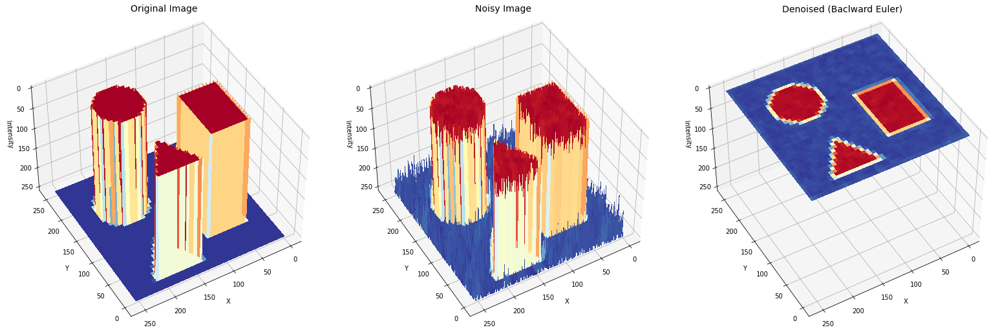

In [373]:
#B.Euler heatmaps

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

images = [synth_img, noisy_img, beuler_denoised]
titles = ['Original Image', 'Noisy Image', 'Denoised (Baclward Euler)']

X, Y = np.meshgrid(np.arange(synth_img.shape[1]), np.arange(synth_img.shape[0]))

fig_behmp = plt.figure(figsize=(22, 7))
for i in range(3):
    rotated_img = np.rot90(images[i], k=2)
    ax = fig_behmp.add_subplot(1, 3, i+1, projection='3d')
    ax.plot_surface(X, Y, rotated_img, cmap='RdYlBu', linewidth=0, antialiased=False)
    ax.set_title(titles[i], fontsize=14)
    ax.set_zlim(0, 255)
    ax.view_init(elev=45, azim=-120)
    ax.set_xlabel('X'), ax.set_ylabel('Y'), ax.set_zlabel('Intensity')
    ax.set_zlim(ax.get_zlim()[::-1])
    ax.invert_xaxis()

plt.tight_layout()
fig_behmp.savefig('Project/B_Euler_HMap.png',transparent=True)
plt.show()


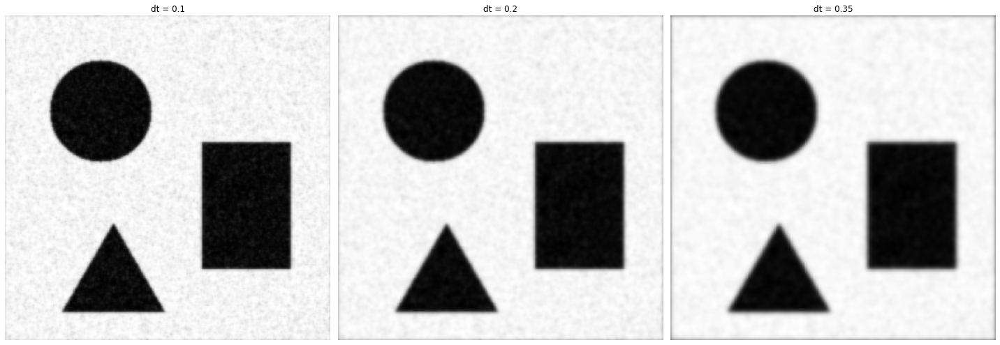

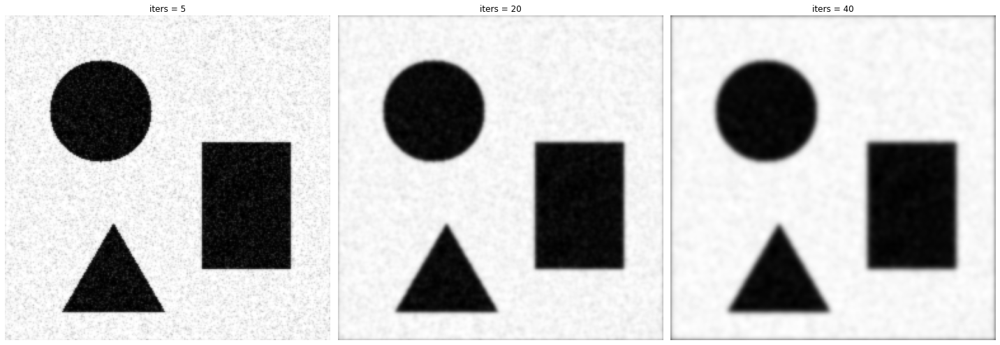

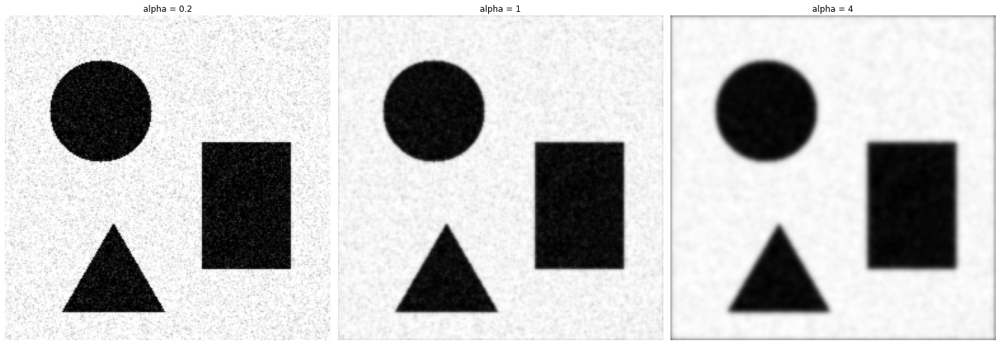

In [374]:
dx = dy = 1.0

# ------------------------
# 1. Varying delta t
# ------------------------
dt_vals = [0.1, 0.2, 0.35]
alpha = 1
num_iters = 10

fig_t, axes = plt.subplots(1, len(dt_vals), figsize=(20, 8))
for i, dt in enumerate(dt_vals):
    padded = np.pad(noisy_img, 1, mode='edge')
    result = backward_euler(padded, alpha, dt, dx, num_iters)
    result = result[1:-1, 1:-1]
    result = np.clip(result, 0, 255)
    axes[i].imshow(result, cmap='gray')
    axes[i].set_title(f"dt = {dt}")
    axes[i].axis('off')
plt.tight_layout()
fig_t.savefig('Project/B_Euler_t.png', transparent=True)
plt.show()

# ------------------------
# 2. Varying number of iterations
# ------------------------
iter_vals = [5, 20, 40]
alpha = 1
dt = 0.1

fig_it, axes = plt.subplots(1, len(iter_vals), figsize=(20, 8))
for i, num_iters in enumerate(iter_vals):
    padded = np.pad(noisy_img, 1, mode='edge')
    result = backward_euler(padded, alpha, dt, dx, num_iters)
    result = result[1:-1, 1:-1]
    result = np.clip(result, 0, 255)
    axes[i].imshow(result, cmap='gray')
    axes[i].set_title(f"iters = {num_iters}")
    axes[i].axis('off')
plt.tight_layout()
fig_it.savefig('Project/B_Euler_iter.png', transparent=True)
plt.show()

# ------------------------
# 3. Varying alpha
# ------------------------
alpha_vals = [0.2, 1, 4]
dt = 0.1
num_iters = 10

fig_alpha, axes = plt.subplots(1, len(alpha_vals), figsize=(20, 8))
for i, alpha in enumerate(alpha_vals):
    padded = np.pad(noisy_img, 1, mode='edge')
    result = backward_euler(padded, alpha, dt, dx, num_iters)
    result = result[1:-1, 1:-1]
    result = np.clip(result, 0, 255)
    axes[i].imshow(result, cmap='gray')
    axes[i].set_title(f"alpha = {alpha}")
    axes[i].axis('off')
plt.tight_layout()
fig_alpha.savefig('Project/B_Euler_alpha.png', transparent=True)
plt.show()


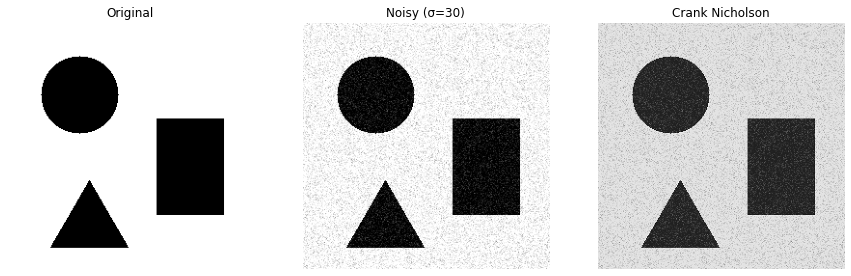

In [375]:
#Crank Nicholson (theta = 0.5)

def crank_nicolson(u0, alpha, dt, dx, num_iters):
    n, m = u0.shape  # n = rows (y-dir), m = cols (x-dir)
    lam = alpha * dt / dx**2

    # 1D Laplacian in x
    main_diag_x = 2 * np.ones(m)
    off_diag_x = -1 * np.ones(m - 1)
    Lx = diags([off_diag_x, main_diag_x, off_diag_x], [-1, 0, 1], shape=(m, m))

    # 1D Laplacian in y
    main_diag_y = 2 * np.ones(n)
    off_diag_y = -1 * np.ones(n - 1)
    Ly = diags([off_diag_y, main_diag_y, off_diag_y], [-1, 0, 1], shape=(n, n))

    # 2D Laplacian using Kronecker sum
    L = kron(identity(n), Lx) + kron(Ly, identity(m))

    # Construct matrices A and B
    A = identity(n * m) - (lam / 2) * L
    B = identity(n * m) + (lam / 2) * L

    u = u0.flatten()
    for _ in range(num_iters):
        b = B @ u
        u = spsolve(A, b)

    return u.reshape((n, m))

dx = dy = 1
alpha = 0.1
dt = 0.1
num_iters = 5

padded = np.pad(noisy_img, 1, mode='edge')
denoised = crank_nicolson(padded, alpha, dt, dx, num_iters)
cn_denoised = denoised[1:-1, 1:-1]

fig_cn, axes = plt.subplots(1, 3, figsize=(15, 6))
axes = axes.flatten()

axes[0].imshow(synth_img, cmap='gray')
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(noisy_img, cmap='gray')
axes[1].set_title(f'Noisy (σ={noise_coeff})')
axes[1].axis('off')

axes[2].imshow(cn_denoised, cmap='gray')
axes[2].set_title('Crank Nicholson')
axes[2].axis('off')
fig_cn.savefig('Project/CN_1.png',transparent=True)
plt.show()

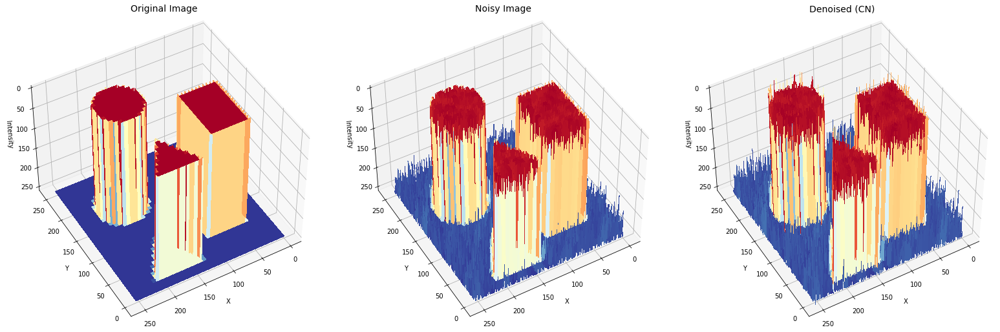

In [376]:
#CN heatmaps

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

images = [synth_img, noisy_img, cn_denoised]
titles = ['Original Image', 'Noisy Image', 'Denoised (CN)']

X, Y = np.meshgrid(np.arange(synth_img.shape[1]), np.arange(synth_img.shape[0]))

fig_cnhmp = plt.figure(figsize=(22, 7))
for i in range(3):
    rotated_img = np.rot90(images[i], k=2)
    ax = fig_cnhmp.add_subplot(1, 3, i+1, projection='3d')
    ax.plot_surface(X, Y, rotated_img, cmap='RdYlBu', linewidth=0, antialiased=False)
    ax.set_title(titles[i], fontsize=14)
    ax.set_zlim(0, 255)
    ax.view_init(elev=45, azim=-120)
    ax.set_xlabel('X'), ax.set_ylabel('Y'), ax.set_zlabel('Intensity')
    ax.set_zlim(ax.get_zlim()[::-1])
    ax.invert_xaxis()

plt.tight_layout()
fig_cnhmp.savefig('Project/CN_HMap.png',transparent=True)
plt.show()

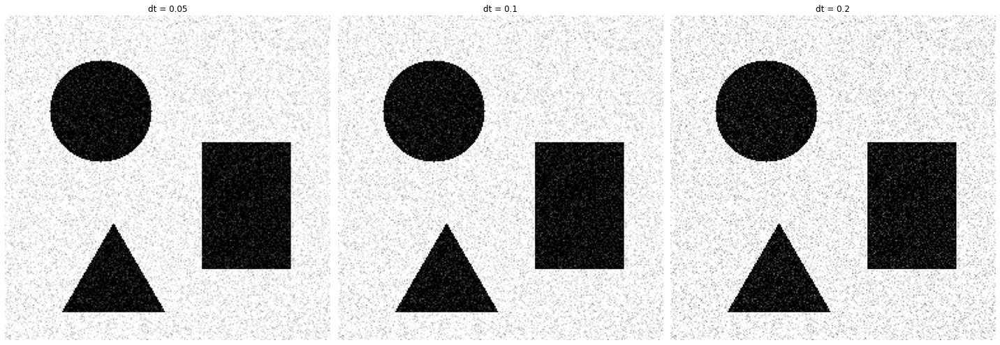

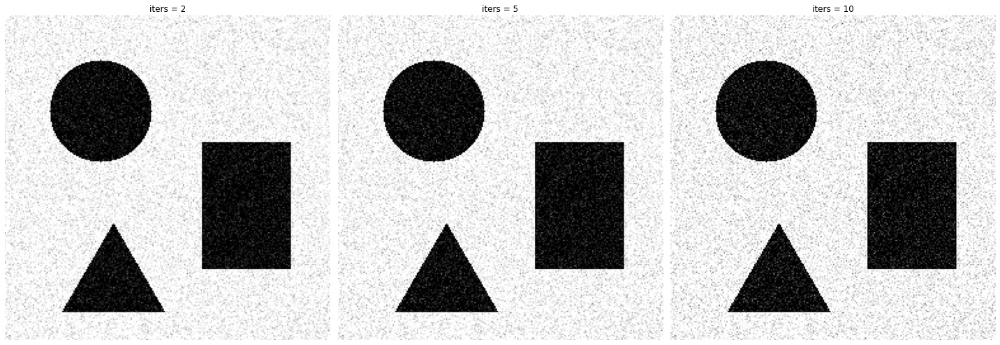

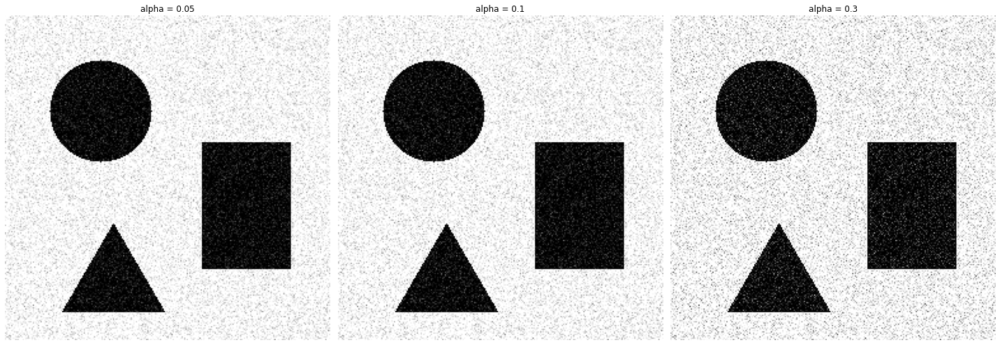

In [377]:
# ------------------------
# 1. Varying delta t
# ------------------------
dt_vals = [0.05, 0.1, 0.2]
alpha = 0.1
num_iters = 5

fig_t, axes = plt.subplots(1, len(dt_vals), figsize=(20, 8))
for i, dt in enumerate(dt_vals):
    padded = np.pad(noisy_img, 1, mode='edge')
    result = crank_nicolson(padded, alpha, dt, dx, num_iters)
    result = result[1:-1, 1:-1]
    result = np.clip(result, 0, 255)
    axes[i].imshow(result, cmap='gray')
    axes[i].set_title(f"dt = {dt}")
    axes[i].axis('off')
plt.tight_layout()
fig_t.savefig('Project/CN_Euler_t.png', transparent=True)
plt.show()


# ------------------------
# 2. Varying number of iterations
# ------------------------
iter_vals = [2, 5, 10]
alpha = 0.1
dt = 0.1

fig_it, axes = plt.subplots(1, len(iter_vals), figsize=(20, 8))
for i, num_iters in enumerate(iter_vals):
    padded = np.pad(noisy_img, 1, mode='edge')
    result = crank_nicolson(padded, alpha, dt, dx, num_iters)
    result = result[1:-1, 1:-1]
    result = np.clip(result, 0, 255)
    axes[i].imshow(result, cmap='gray')
    axes[i].set_title(f"iters = {num_iters}")
    axes[i].axis('off')
plt.tight_layout()
fig_it.savefig('Project/CN_Euler_iter.png', transparent=True)
plt.show()


# ------------------------
# 3. Varying alpha
# ------------------------
alpha_vals = [0.05, 0.1, 0.3]
dt = 0.1
num_iters = 5

fig_alpha, axes = plt.subplots(1, len(alpha_vals), figsize=(20, 8))
for i, alpha in enumerate(alpha_vals):
    padded = np.pad(noisy_img, 1, mode='edge')
    result = crank_nicolson(padded, alpha, dt, dx, num_iters)
    result = result[1:-1, 1:-1]
    result = np.clip(result, 0, 255)
    axes[i].imshow(result, cmap='gray')
    axes[i].set_title(f"alpha = {alpha}")
    axes[i].axis('off')
plt.tight_layout()
fig_alpha.savefig('Project/CN_Euler_alpha.png', transparent=True)
plt.show()


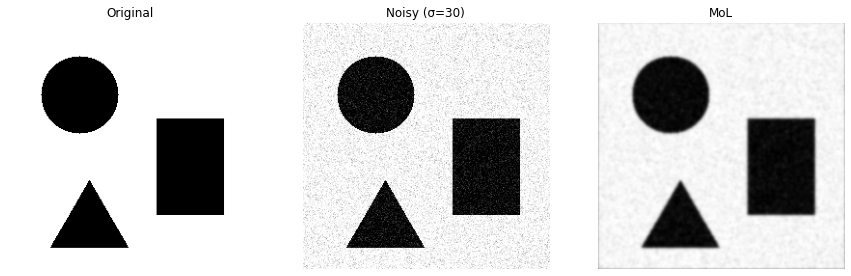

In [378]:
# MoL

def method_of_lines(u0, alpha, dx, t_span, t_eval):
    n, m = u0.shape
    lam = 1.0 / dx**2  # spatial factor only

    # 1D Laplacian matrices
    main_x = -2 * np.ones(m)
    off_x = np.ones(m - 1)
    Lx = diags([off_x, main_x, off_x], [-1, 0, 1], shape=(m, m))

    main_y = -2 * np.ones(n)
    off_y = np.ones(n - 1)
    Ly = diags([off_y, main_y, off_y], [-1, 0, 1], shape=(n, n))

    # 2D Laplacian using Kronecker sum
    L = lam * (kron(identity(n), Lx) + kron(Ly, identity(m)))  # shape (nm, nm)

    def rhs(t, u):
        return alpha * (L @ u)

    u0_flat = u0.flatten()
    sol = solve_ivp(rhs, t_span, u0_flat, t_eval=t_eval, method='RK45')
    
    # Return (len(t_eval), n, m) array
    return sol.y.T.reshape(-1, n, m)

dx = dy = 0.01
alpha = 1

t_span = (0, 0.0005)
t_eval = np.linspace(0, 0.0001, 10)

#Neumann BC
padded = np.pad(noisy_img, 1, mode='edge')
mol_denoised = method_of_lines(padded, alpha, dx, t_span=t_span, t_eval=t_eval)
mol_denoised = mol_denoised[:,1:-1, 1:-1]

fig_mol, axes = plt.subplots(1, 3, figsize=(15, 6))
axes = axes.flatten()

axes[0].imshow(synth_img, cmap='gray')
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(noisy_img, cmap='gray')
axes[1].set_title(f'Noisy (σ={noise_coeff})')
axes[1].axis('off')

axes[2].imshow(mol_denoised[-1,:,:], cmap='gray')
axes[2].set_title('MoL')
axes[2].axis('off')
fig_mol.savefig('Project/MOL_1.png',transparent=True)
plt.show()

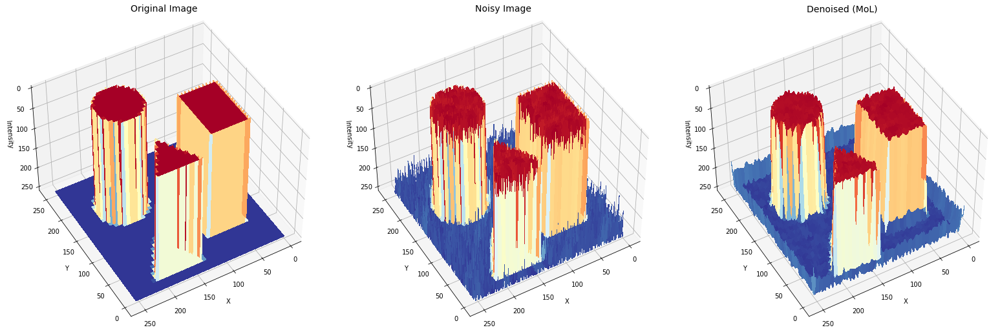

In [379]:
#CN heatmaps

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

images = [synth_img, noisy_img, mol_denoised[-1,:,:]]
titles = ['Original Image', 'Noisy Image', 'Denoised (MoL)']

X, Y = np.meshgrid(np.arange(synth_img.shape[1]), np.arange(synth_img.shape[0]))

fig_molhmp = plt.figure(figsize=(22, 7))
for i in range(3):
    rotated_img = np.rot90(images[i], k=2)
    ax = fig_molhmp.add_subplot(1, 3, i+1, projection='3d')
    ax.plot_surface(X, Y, rotated_img, cmap='RdYlBu', linewidth=0, antialiased=False)
    ax.set_title(titles[i], fontsize=14)
    ax.set_zlim(0, 255)
    ax.view_init(elev=45, azim=-120)
    ax.set_xlabel('X'), ax.set_ylabel('Y'), ax.set_zlabel('Intensity')
    ax.set_zlim(ax.get_zlim()[::-1])
    ax.invert_xaxis()

plt.tight_layout()
fig_molhmp.savefig('Project/MOL_HMap.png',transparent=True)
plt.show()

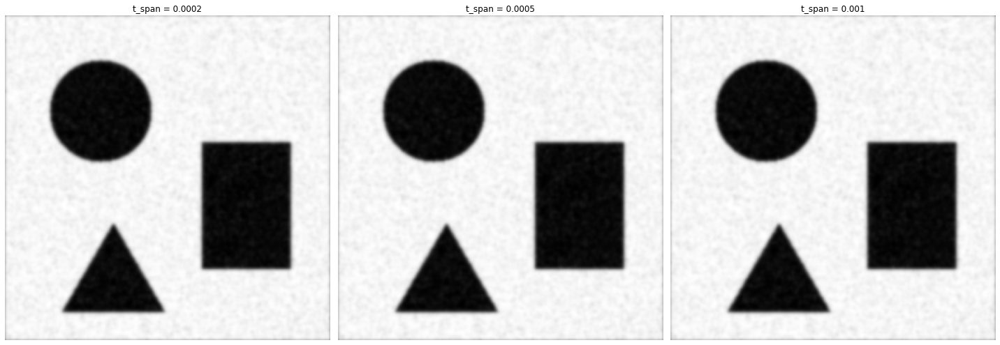

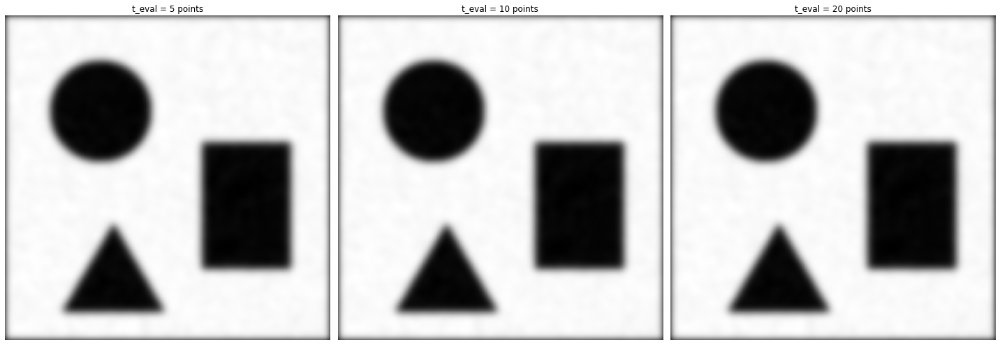

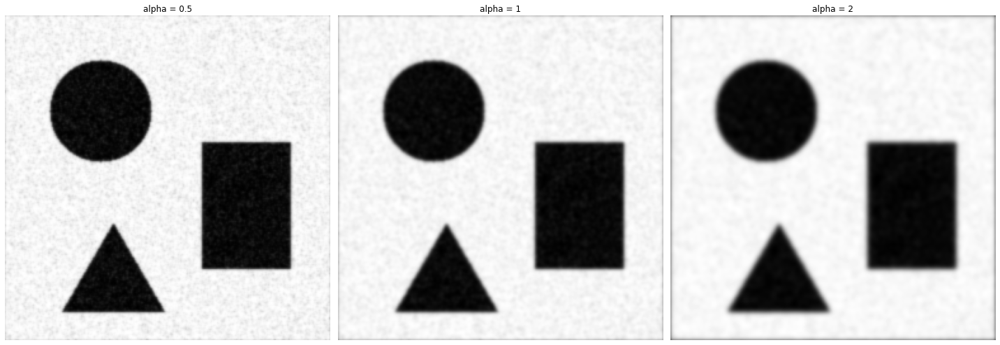

In [380]:
# ------------------------
# 1. Varying t_span (total simulation time)
# ------------------------
t_spans = [(0, 0.0002), (0, 0.0005), (0, 0.001)]
alpha = 1
dx = dy = 0.01
t_eval = np.linspace(0, 0.0001, 10)

fig_tspan, axes = plt.subplots(1, len(t_spans), figsize=(20, 8))
for i, t_span in enumerate(t_spans):
    padded = np.pad(noisy_img, 1, mode='edge')
    result = method_of_lines(padded, alpha, dx, t_span=t_span, t_eval=t_eval)
    last_frame = result[-1, 1:-1, 1:-1]
    last_frame = np.clip(last_frame, 0, 255)
    axes[i].imshow(last_frame, cmap='gray')
    axes[i].set_title(f"t_span = {t_span[1]:.4g}")
    axes[i].axis('off')
plt.tight_layout()
fig_tspan.savefig('Project/MoL_tspan.png', transparent=True)
plt.show()


# ------------------------
# 2. Varying number of time samples (t_eval resolution)
# ------------------------
eval_counts = [5, 10, 20]
t_span = (0, 0.0005)

fig_teval, axes = plt.subplots(1, len(eval_counts), figsize=(20, 8))
for i, count in enumerate(eval_counts):
    t_eval = np.linspace(t_span[0], t_span[1], count)
    padded = np.pad(noisy_img, 1, mode='edge')
    result = method_of_lines(padded, alpha, dx, t_span=t_span, t_eval=t_eval)
    last_frame = result[-1, 1:-1, 1:-1]
    last_frame = np.clip(last_frame, 0, 255)
    axes[i].imshow(last_frame, cmap='gray')
    axes[i].set_title(f"t_eval = {count} points")
    axes[i].axis('off')
plt.tight_layout()
fig_teval.savefig('Project/MoL_teval.png', transparent=True)
plt.show()


# ------------------------
# 3. Varying alpha (diffusivity)
# ------------------------
alpha_vals = [0.5, 1, 2]
t_span = (0, 0.0005)
t_eval = np.linspace(0, 0.0001, 10)

fig_alpha, axes = plt.subplots(1, len(alpha_vals), figsize=(20, 8))
for i, alpha in enumerate(alpha_vals):
    padded = np.pad(noisy_img, 1, mode='edge')
    result = method_of_lines(padded, alpha, dx, t_span=t_span, t_eval=t_eval)
    last_frame = result[-1, 1:-1, 1:-1]
    last_frame = np.clip(last_frame, 0, 255)
    axes[i].imshow(last_frame, cmap='gray')
    axes[i].set_title(f"alpha = {alpha}")
    axes[i].axis('off')
plt.tight_layout()
fig_alpha.savefig('Project/MoL_alpha.png', transparent=True)
plt.show()
